 <font size="6">Сверточные нейронные сети</font>

# Введение в сверточные нейронные сети

### Введение
**Cвёрточные нейронные сети** (CNN) – это особый тип нейросетей, предназначенный для анализа данных с пространственной структурой, в первую очередь изображений и видео.

Они уже стали стандартом в задачах распознавания визуальной информации. В отличие от обычных полносвязных сетей, свёрточные нейросети способны эффективно выявлять локальные признаки на изображениях – например, края, углы, текстуры – и на их основе узнавать более сложные объекты. Такие сети широко применяются на практике: от диагностики по медицинским снимкам до систем компьютерного зрения в автомобилях.

Например, свёрточные сети помогают анализировать МРТ и рентгеновские снимки для постановки диагноза. Прежде чем углубиться в устройство CNN, сравним их подход с классическими полносвязными сетями.

На прошлом занятии мы научились строить сети из нескольких полносвязных слоев для задачи распознавания картинок.


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout, Input

def create_model():
    """Создание и компиляция модели нейронной сети на Keras"""
    model = Sequential([
        Input(shape=(28, 28)),             # входной слой
        Flatten(),                         # разворачиваем картинку в вектор
        Dense(128, activation="relu"),
        Dropout(0.2),
        Dense(64, activation="relu"),
        Dropout(0.1),
        Dense(10, activation="softmax")    # выходной слой для классификации
    ])

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/modified_model.png" width="600">

$\large h=W_1 \cdot x$
    
$\large S=W_2 \cdot f(h)=W_2 \cdot f(W_1 \cdot x)$

**Полносвязная (классическая) нейросеть** устроена так, что каждый нейрон каждого слоя соединён со всеми выходами предыдущего слоя. При работе с изображением такой подход игнорирует структуру пикселей: связь каждого входного пикселя с каждым нейроном приводит к огромному числу параметров и не учитывает, какие пиксели являются соседними на картинке.

### MLP для картинок

Наверное, самый простой способ построить нейронную сеть для решения задачи классификации на наших данных — это «развернуть» нашу картинку в вектор, а затем использовать обычную многослойную сеть с кросс-энтропией в качестве лосса.

Однако, такой подход имеет несколько недостатков.


**Недостаток №1:** количество параметров

В первом слое у нас получается `HxWxCxCout` параметров, где `Cout` — это количество нейронов в первом слое. Если поставить `Cout` слишком маленьким, мы рискуем потерять много важной информации, особенно, если рассматривать картинки размером, например, 1920x1080.

Если же выставить `Cout` большим, рискуем получить слишком много параметров (а это только первый слой), а с этим и все вытекающие проблемы — переобучение, сложность оптимизации и так далее.

**Недостаток №2:** структура данных никак не учитывается.

Что здесь имеется в виду под «структурой»? Попробуем объяснить на примере.

## Нарушение связей между соседними пикселями

При вытягивании изображения в вектор мы теряем информацию о взаимном расположении пикселей на исходной картинке.





 <img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/img_to_vector_problem.png" width="900">

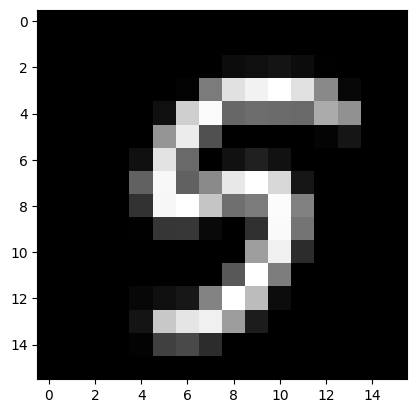

In [ ]:
import numpy as np
from PIL import Image


image = Image.open("digit.png")
img_np = np.array(image)
plt.imshow(img_np, cmap="gray")
plt.show()

In [ ]:
print(img_np)

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0  12  15  20  12   1   0   0   0]
 [  0   0   0   0   0   0   3 123 225 242 255 225 137   7   0   0]
 [  0   0   0   0   0  15 207 251 103 109 107 105 171 145   0   0]
 [  0   0   0   0   0 149 236  80   0   0   0   0   4  21   0   0]
 [  0   0   0   0  16 228 106   0  17  33  17   0   0   0   0   0]
 [  0   0   0   0  97 248  98 138 232 255 216  22   0   0   0   0]
 [  0   0   0   0  50 247 255 197 111 123 252 129   0   0   0   0]
 [  0   0   0   0   1  54  55   9   0  49 250 116   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0 158 240  44   0   0   0   0]
 [  0   0   0   0   0   0   0   0  88 255 125   0   0   0   0   0]
 [  0   0   0   0   7  15  23 132 255 188  12   0   0   0   0   0]
 [  0   0   0   0  20 200 229 240 157  28   0   0   0   0   0   0]
 [  0   0   0   0   3  64  73  45   0   0   0   0   0   0   0 

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 12, 15, 20, 12, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 123, 225, 242, 255, 225, 137, 7, 0, 0, 0, 0, 0, 0, 0, 15, 207, 251, 103, 109, 107, 105, 171, 145, 0, 0, 0, 0, 0, 0, 0, 149, 236, 80, 0, 0, 0, 0, 4, 21, 0, 0, 0, 0, 0, 0, 16, 228, 106, 0, 17, 33, 17, 0, 0, 0, 0, 0, 0, 0, 0, 0, 97, 248, 98, 138, 232, 255, 216, 22, 0, 0, 0, 0, 0, 0, 0, 0, 50, 247, 255, 197, 111, 123, 252, 129, 0, 0, 0, 0, 0, 0, 0, 0, 1, 54, 55, 9, 0, 49, 250, 116, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 158, 240, 44, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 88, 255, 125, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 15, 23, 132, 255, 188, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 200, 229, 240, 157, 28, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 64, 73, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


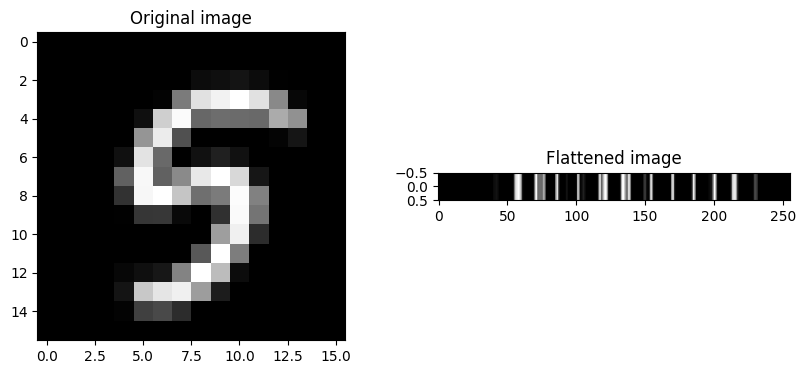

In [ ]:
fig, ax = plt.subplots(ncols=2, figsize=(10, 4))
ax[0].imshow(img_np, cmap="gray")
ax[1].imshow(img_np.reshape(1, -1), aspect=20, cmap="gray")
ax[0].set_title("Original image")
ax[1].set_title("Flattened image")

vector = np.array(image).flatten()
print(vector.tolist())

Пиксели, которые были соседними и составляли цельный объект, могут оказаться на большом расстоянии внутри результирующего вектора. Получается, что мы просто удалили информацию об их близости, важность которой нам как людям очевидна.

Идея полносвязной нейронной сети пришла к нам из математической модели восприятия информации мозгом. Возможно, чтобы получить хорошие результаты при обработке изображений, нужно посмотреть, как работает человеческий глаз?


### Рецептивное поле

В полносвязной сети каждый нейрон "видит" сразу все изображение (все данные). Наша зрительная система работает иначе.

*  Каждый фоторецептор на сетчатке нашего глаза (палочка или колбочка) реагирует только на свет, попавший на него.

* Сигнал от фоторецептора попадает на нейрон следующего уровня. Этот нейрон уже соединен с несколькими фоторецепторами. Область, в которой они локализованы, называется **рецептивным полем**.
Нейрон возбуждается при определенной комбинации сигналов от связанных с ним рецепторных клеток. По сути, он реагирует на простой, локально расположенный паттерн.

* Клетки уровнем выше (ганглиозные) собирают информацию с нескольких близко расположенных биполярных клеток и активируются при уникальной комбинации сигналов с них. Их рецептивное поле больше, и паттерны, на которые они реагируют, сложнее.

**Рецептивное поле** нейрона — это участок с рецепторами, с которых он прямо или опосредованно, через другие нейроны, получает информацию.


<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/brain.png" width="1000">

* Далее сигнал передается в мозг, но там связи между нейронами продолжают оставаться иерархическими. Рецептивное поле нейронов растет, и паттерны, на которые они активируются, становятся все более и более сложными.

### Скользящее окно (фильтр)

Получается, что можно не подавать на вход нейрона первого слоя информацию о всем изображении сразу, а "показать" ему только часть картинки, чтобы он научился распознавать простые, но универсальные паттерны. А их агрегация произойдет в последующих слоях.

Для этого используется так называемое "скользящее окно", которое двигается по изображению, захватывая на каждом шаге только небольшую область.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/convolution_with_filter_step1.png" width="600">


<font color=2BA8E0 size=30>0</font>
<font color=000000 size=30>×</font>
<font color=6aa84f size=30>6 </font>
<font color=000000 size=30>+ </font>
<font color=2BA8E0 size=30>1</font>
<font color=000000 size=30>×</font>
<font color=6aa84f size=30>7 </font>
<font color=000000 size=30>+ </font>
<font color=2BA8E0 size=30>3</font>
<font color=000000 size=30>×</font>
<font color=6aa84f size=30>8 </font>
<font color=000000 size=30>+ </font>
<font color=2BA8E0 size=30>4</font>
<font color=000000 size=30>×</font>
<font color=6aa84f size=30>9 </font>
<font color=000000 size=30>= </font>
<font color=38761d size=30>67</font>



<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/convolution_with_filter.gif" width="600">

### Фильтры размытия

Такой подход используют, например, при наложении графических **фильтров**. Вы наверняка пользовались ими, если работали в графических редакторах, например, в Photoshop.



Простейший фильтр — это [Box blur 📚[wiki]](https://en.wikipedia.org/wiki/Box_blur), который просто усредняет значения соседних пикселей.

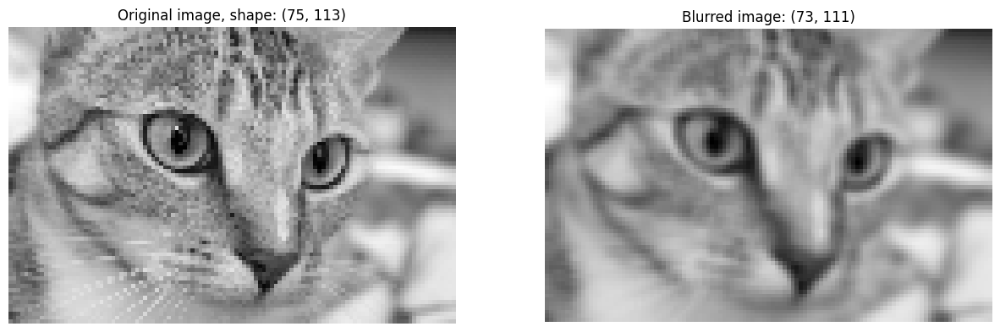

In [ ]:
from skimage import data, color
from skimage.transform import rescale

# fmt: off

box_blur_kernel = 1/9 * np.array([[1, 1, 1],
                                  [1, 1, 1],
                                  [1, 1, 1]])
# fmt: on


def apply_filter(img, kernel):
    h, w = np.array(img.shape)  # image height and width
    kh, kw = np.array(kernel.shape)  # kernel height and width (3x3)
    # Calculate the output size
    out = np.zeros((h - kh + 1, w - kw + 1))
    for i in range(h - kh + 1):
        for j in range(w - kw + 1):
            # Get 3x3 patch from image
            patch = img[i : i + kh, j : j + kw]
            # Elementwise multiply patch pixels to kernel weights and sum
            new_pixel = np.multiply(patch, kernel).sum()
            # Store modified pixel in new blurred image
            out[i, j] = new_pixel
    return out


def show(img, result):
    # Display results
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    axes[0].imshow(img, cmap="gray")
    axes[1].imshow(out, cmap="gray")
    axes[0].set(title=f"Original image, shape: {img_cat_resc.shape}")
    axes[1].set(title=f"Blurred image: {out.shape}")
    axes[0].axis("off")
    axes[1].axis("off")
    plt.show()


img_cat = color.rgb2gray(data.cat())
img_cat_resc = rescale(img_cat, 0.25, anti_aliasing=False) * 255

out = apply_filter(img_cat_resc, box_blur_kernel)
show(img_cat_resc, out)

Можно умножать каждый пиксель на свой коэффициент. Так устроен, например, [фильтр Гаусса 📚[wiki]](https://en.wikipedia.org/wiki/Gaussian_blur).

Реализуем фильтр Гаусса размером $3\times3$ для размытия изображения:

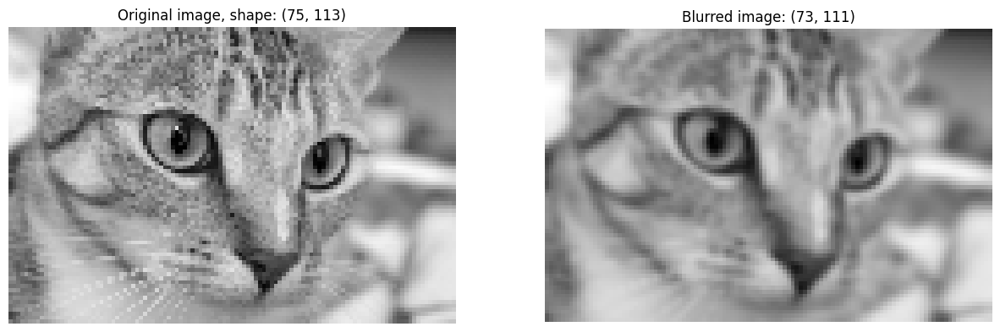

In [ ]:
# fmt: off
# Gaussian 3x3 kernel, sum of weights == 1
gauss_kernel = np.array([[1/16, 1/8, 1/16],
                         [1/8,  1/4, 1/8 ],
                         [1/16, 1/8, 1/16]])
# fmt: on

out = apply_filter(img_cat_resc, gauss_kernel)
show(img_cat_resc, out)

Последовательность действий:

*  Для каждого пикселя исходного изображения берем окрестность размером $3 \times 3$.
*  Значение каждого пикселя из этой окрестности умножаем на соответствующее значение из массива `kernel` (тоже $3 \times 3$).
*  Затем суммируем все 9 результатов, получившееся число записываем в новый массив.
* В результате получаем сглаженное изображение.

Таким образом, для получения нового изображения мы применили формулу:

$$\large \text{output}(x,y) =  \sum_{i}^{H} \sum_{j}^{W}k[i,j] I[x+j,y+i],$$

где $H, W$ — высота и ширина ядра фильтра, $I$ — исходное изображение.

### Фильтры для обнаружения паттернов

Такой же алгоритм можно применять не для сглаживания изображения, а для поиска (выделения) на нем чего-либо (например, контуров объектов). Для этого достаточно заменить ядро фильтра.

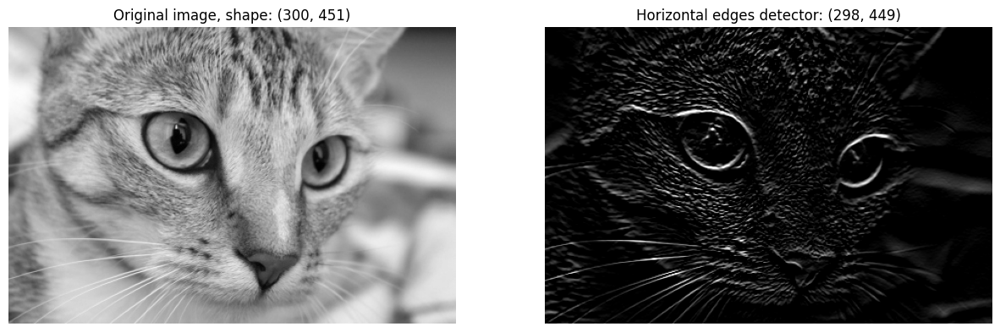

In [ ]:
# fmt: off
sobel_y_kernel = np.array([[ 1.0,  2.0, 1.0 ],
                           [ 0.0,  0.0, 0.0 ],
                           [-1.0, -2.0, -1.0]])
# fmt: on

x_edges = apply_filter(img_cat * 255, sobel_y_kernel)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
axes[0].imshow(img_cat, cmap="gray")
axes[1].imshow(x_edges, cmap="gray", vmin=0, vmax=255)
axes[0].set(title=f"Original image, shape: {img_cat.shape}")
axes[1].set(title=f"Horizontal edges detector: {x_edges.shape}")
axes[0].axis("off")
axes[1].axis("off")
plt.show()

Мы применили к изображению [фильтр Cобеля 📚[wiki]](https://en.wikipedia.org/wiki/Sobel_operator), а точнее, одно из его ядер, дающее отклик на перепад яркости по горизонтали.

"Отклик" — это величина яркости, которую мы получили на результирующем изображении.

Можно запрограммировать свой фильтр, который будет искать произвольный объект.Например, найдем крест на на изображении.

Для этого создадим фильтр размером с объект ($3 \times 3$). В точках, где должны быть пиксели, принадлежащие объекту, поместим положительные значения, а там, где должен быть фон, — отрицательные.



In [ ]:
# fmt: off

kernel_cs = np.array([[-1, 1, -1],
                      [ 1, 1,  1],
                      [-1, 1, -1]])
# fmt: on

При попадании такого фильтра на объект отрицательные значения обнулятся при перемножении с пикселями фона, а положительные — просуммируются и дадут высокий отклик.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/cross_filter.png" width="900">


Такого рода фильтров люди придумали довольно много. Есть [детектор углов Харриса 📚[wiki]](https://en.wikipedia.org/wiki/Harris_Corner_Detector) или [признаки Хаара 📚[wiki]](https://en.wikipedia.org/wiki/Haar-like_feature), которые успешно использовались для [обнаружения лиц 📚[wiki]](https://en.wikipedia.org/wiki/Viola%E2%80%93Jones_object_detection_framework) на фотографиях. Это примеры случаев, когда людям удалось подобрать удачные ядра фильтров для решения конкретных задач.

Мы хотим, чтобы модель могла обучаться решать различные задачи. И вместо того, чтобы вручную создавать фильтры, мы будем подбирать их значения **в процессе обучения**.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/mlp_vs_cnn.png" width="1000">

Тогда модель сможет выучивать шаблоны для небольших фрагментов изображения и станет инвариантной к сдвигу.

## Свертка с фильтром

Операцию применения фильтра к изображению будем называть *сверткой*. Это определение не вполне соответствует [математическому 📚[wiki]](https://en.wikipedia.org/wiki/Convolution), но повсеместно используется в DL.

По своей сути операция свёртки — это та же самая взвешенная сумма с добавлением свободного члена, используемая в полносвязных линейных слоях.

В фильтрах [Собеля 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%9E%D0%BF%D0%B5%D1%80%D0%B0%D1%82%D0%BE%D1%80_%D0%A1%D0%BE%D0%B1%D0%B5%D0%BB%D1%8F) и [Гаусса 📚[wiki]](https://en.wikipedia.org/wiki/Gaussian_blur) свободный член отсутствовал, но в дальнейшем мы будем его использовать.

Ключевое отличие между линейным слоем и свёрткой заключается в том, что каждый нейрон линейного слоя получает на вход всё изображение сразу, а свёртка — небольшие фрагменты.

Так как при свертке для каждого фрагмента получаем свой отклик (признак), то для всего изображения получим уже массив признаков (feature map).




<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/neuron_output.png" width="700">

# Сверточный слой нейросети

**Свёрточный слой** – ключевой элемент CNN, выполняющий операцию свёртки. Он состоит из набора фильтров (ядер свёртки) – небольших матриц коэффициентов (чаще всего размером $3\times3$).

Каждый фильтр отвечает за выявление какого-то простого признака в изображении (например, горизонтального края, угла, участка определённой текстуры и т.д.). Нейросеть не задана этими фильтрами вручную – их значения (веса) обучаются на данных.

В PyTorch есть класс `nn.Conv2d` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html), который реализует операцию свертки для целого изображения.

Если рассматривать библиотеку Keras, то там тоже самое:

`model.add(Conv2D(32, kernel_size = (3, 3), activation = 'relu', input_shape = (28, 28, 1)))`


In [ ]:
import torch
import numpy as np

# fmt: off
cross = np.array([[0, 0 ,0, 0, 0],
                  [0, 0, 0, 0, 0],
                  [0, 0, 0, 1, 0],
                  [0, 0, 1, 1, 1],
                  [0, 0, 0, 1, 0]])

kernel_cs = np.array([[-1, 1, -1],
                      [ 1, 1,  1],
                      [-1, 1, -1]])
# fmt: on

cross_in_tensor = torch.tensor(cross).float()

In [ ]:
from torch.nn import Conv2d

conv = Conv2d(
    in_channels=1,  # what's this ?
    out_channels=1,  # what's this ?
    kernel_size=(3, 3),  # kernel.shape == 3x3
    bias=False,
)
# conv2d accepts input of shape BxCxHxW
feature_map = conv(
    cross_in_tensor.unsqueeze(0).unsqueeze(0)  # HxW -> BxCxHxW
)  # add batch and channel dim
print(feature_map)

tensor([[[[ 0.0000,  0.0766,  0.1660],
          [ 0.0766,  0.0715, -0.0042],
          [-0.1711,  0.1786,  0.4230]]]], grad_fn=<ConvolutionBackward0>)


При создании экземпляра объекта класса `nn.Conv2D` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html) помимо размера ядра (`kernel_size`) мы передали в конструктор еще два параметра:

`in_channels = 1 ` и `out_channels = 1`

Разберемся, что они означают.

### Обработка цветных/многоканальных изображений

`in_channels` — это количество каналов входного тензора (изображения).

В примерах выше мы рассматривали [черно-белые 📚[wiki]](https://ru.wikipedia.org/wiki/Чёрно-белая_фотография) изображения. Их также называют одноканальными изображениями, т. к. в них цвет пикселя определяется одним числом, характеризующим яркость. Хранятся они в двумерном массиве размером $[H,W]$.

Цветные изображения хранятся в трехмерных массивах $[H,W,C]$ (для формата numpy, OpenCV, Keras) или $[C,H,W]$ (тензорный формат PyTorch), где $C$ — количество цветовых каналов. Для $\text{RGB}$-изображений $C=3$.

Так как `Conv2d` рассчитан на работу с многоканальным входом, то в коде выше нам пришлось написать дополнительный `unsqueeze(0)`, чтобы добавить к тензору с изображением это $3$-е измерение, т. е. перевести $[H,W]$ в $[C,H,W]$, где $C = 1$.

Важно, что для каждого канала будет создано дополнительное ядро фильтра.

B = Batch size (размер батча) → количество изображений в пакете.

Если ты подаёшь сразу 1 картинку → B = 1.

Если подаёшь 32 картинки → B = 32.

Нужен потому, что PyTorch и вообще все современные фреймворки сразу оптимизированы под обучение на мини-батчах.

C = Channels → число каналов (1 для ч/б, 3 для RGB, 64 и т.д. для карт признаков внутри сети).

H = Height → высота (количество строк пикселей).

W = Width → ширина (количество столбцов пикселей).

Опробуем трехканальную свертку на цветном изображении:

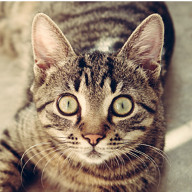

In [ ]:
from PIL import Image

cat_in_pil = Image.open("cat.jpg")
display(cat_in_pil)

Изображение из формата Pillow надо превратить в `torch.Tensor`:

In [ ]:
cat_in_np = np.array(cat_in_pil)  # pillow -> numpy
cat_in_float = cat_in_np.astype(np.float32) / 255  # int->float
cat_in_tensor = torch.tensor(cat_in_float)  # np -> torch

try:
    conv_ch3(cat_in_tensor.unsqueeze(0))  # add batch dimension
except Exception as e:
    print("Error: \n", e)

Error: 
 Given groups=1, weight of size [1, 3, 5, 5], expected input[1, 192, 192, 3] to have 3 channels, but got 192 channels instead


Получили ошибку, связанную с количеством каналов. Дело в том, что в PyTorch, в отличие от OpenCV, TensorFlow и ряда других библиотек, каналы (RGB) идут в первом, а не в последнем измерении тензора, описывающего картинку.

Keras, OpenCV, TensorFlow, Pillow, etc. : $[\text{Batch}, \text{Height}, \text{Width}, \text{Channels}]$

PyTorch : $[\text{Batch}, \text{Channels}, \text{Height}, \text{Width}]$

Придется сделать дополнительное преобразование, чтобы каналы оказались на том месте, где их ожидает PyTorch:

In [ ]:
print("Original \t", cat_in_tensor.shape, "HWC")
cat_in_tensor_channel_first = cat_in_tensor.permute(2, 0, 1)  # HWC -> CHW
print("Torch style \t", cat_in_tensor_channel_first.shape, "CHW")

Original 	 torch.Size([192, 192, 3]) HWC
Torch style 	 torch.Size([3, 192, 192]) CHW


Теперь можно подать изображение на вход модели, предварительно добавив batch-размерность:

In [ ]:
one_image_batch = cat_in_tensor_channel_first.unsqueeze(0)  # CHW -> BCHW, B = 1
out = conv_ch3(one_image_batch)
print("No error!")

No error!


Нет необходимости проделывать все эти манипуляции вручную, так как в `torchvision.transforms.v2` реализованы функции `to_image` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.ToImage.html) и  `to_dtype` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.ToDtype.html), которые последовательно выполняют  преобразования массива типа `np.array` или `Pillow.image` в класс `Image`, а затем в в `torch.Tensor`.

Убедимся, что тензор, преобразованный нами вручную, и тензор, получившийся после применения функции `to_image` и `to_dtype`, совпали:

In [ ]:
from torchvision.transforms.v2.functional import to_image, to_dtype


cat_in_image = to_image(cat_in_pil)  # convert np.array to PIL.image
cat_in_tensor2 = to_dtype(
    cat_in_image, dtype=torch.float32, scale=True
)  # auto HWC -> CHW

print(cat_in_tensor2.shape)

print(
    "Tensor almost equal: ",
    torch.allclose(cat_in_tensor_channel_first, cat_in_tensor2),  # float comparsion
)

torch.Size([3, 192, 192])
Tensor almost equal:  True


Теперь посмотрим на форму выхода, полученного нами ячейкой выше:

In [ ]:
print("Output feature map size:", out.shape)  # first dim is batch

Output feature map size: torch.Size([1, 1, 188, 188])


Такую размерность имеет выход  **единственного нейрона** в нашем сверточном слое.

На входе несколько каналов (3), на выходе остался один канал.
Как же комбинируются результаты сверток в разных каналах?



<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/convolution_rgb.png" width="700">


Результаты сверток всех ядер фильтра с соответствующими входными каналами просто суммируются:

$\large \displaystyle \text{feature_map}(x,y) = \sum_{c}^{C} \sum_{i}^{H} \sum_{j}^{W}k_c[i,j]I_c[x+j,y+i] + \text{bias},$

$C$ — количество каналов,

$H, W$ — высота и ширина ядра фильтра,

$K_c$ — ядро для канала $c$,

$I$ — изображение (массив $C\times H\times W$),

$I_c$ — канал изображения номер $c$ (срез массива $I$, соответствующий каналу изображения номер $c$).

В силу коммутативности суммы не важно, в каком порядке будут складываться элементы. Можно считать, что каждый элемент входа сначала умножается на свой коэффициент из ядра, а уже затем все суммируется.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/rgb_image_convolution_filter.png" width = "650">

Так выглядит выход одного нейрона, который задается несколькими ядрами и  смещением (bias).

При этом bias  **один** на весь фильтр.

In [ ]:
print("Kernels", conv_ch3.weight.shape)
print("Biases", conv_ch3.bias.shape)

Kernels torch.Size([1, 3, 5, 5])
Biases torch.Size([1])


Входные данные не всегда будут трехканальными цветными [RGB 📚[wiki]](https://ru.wikipedia.org/wiki/RGB)-изображениями, в которых цвет пикселя определяется тремя числами, характеризующими три основных цвета (красный, зеленый и синий).

Входной тензор может иметь произвольное количество каналов. Например: марсоход Opportunity для получения изображений использовал [13 каналов ✏️[blog]](https://habr.com/ru/post/160621/).

Более того, в качестве входного тензора можно использовать не входное изображение, а **карту признаков (feature map)** с выхода предыдущего сверточного слоя.


### Использование нескольких фильтров

Возвращаемся ко второму параметру конструктора `nn.Conv2D` —
`out_channels = 1`. Этот параметр задает количество фильтров слоя. То есть количество выходных карт признаков всегда совпадает с `out_channels` сверточного слоя.

In [ ]:
conv35 = Conv2d(in_channels=3, out_channels=5, kernel_size=3)
out = conv35(cat_in_tensor_channel_first)

print(f"weights shape: {conv35.weight.shape}")  # 5 filters 3x3x3
print(f"weights shape: {conv35.bias.shape}")  # one bias per filter

weights shape: torch.Size([5, 3, 3, 3])
weights shape: torch.Size([5])


В линейном слое каждый нейрон учился активироваться на некий шаблон, например, красную машину или смотрящую направо лошадь.

Мы хотим, чтобы нейроны сверточного слоя также активировались на различные паттерны (например, ухо, нос, глаз и т.д.). Для каждого паттерна нам нужен свой нейрон $⇒$ свой фильтр.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/neuron_is_filter.png" width="700">

 Каждый нейрон сформирует свою карту признаков размера $1\times H_{out}\times W_{out}$. А на выходе слоя будет их конкатенация:

In [ ]:
print(f"result shape: {out.shape}")  # 5 feature maps

result shape: torch.Size([5, 190, 190])


При объединении этих карт получится тензор размерности $C_{out}\times H_{out} \times W_{out}$, где $C_{out}$ — количество фильтров.

Для **примера с Blur** $C_{out} = 1$, т. е. полученное сглаженное изображение представляет собой одну карту признаков после прохождения через сверточный слой с константным фильтром.

На изображении ниже продемонстрирован результат применения сверточного слоя,
содержащего $5$ фильтров, к изображению из CIFAR-10.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/convolution_layer_with_5_filters.png" width="400">

Стоит отметить, что, в отличие от полносвязного слоя, свёрточный слой не требует информации о количестве значений во входном представлении и может быть использован как для представлений $C_{in} \times 32 \times 32$, так и для $C_{in} \times 100 \times 100$. Словом, представления могут иметь практически любой размер, главное, чтобы пространственные размеры не были меньше размеров ядра свёртки.



### Уменьшение размера карты признаков

Карта признаков после применения функции активации может быть передана на вход следующей операции свёртки.

In [ ]:
from torch.nn.functional import relu

conv_1 = torch.nn.Conv2d(
    in_channels=3,  # Number of input channels (3 for RGB images)
    out_channels=6,  # Number of filters/output channels
    kernel_size=5,
)

conv_2 = torch.nn.Conv2d(
    in_channels=6,  # Number of input channels (3 for RGB images)
    out_channels=10,  # Number of filters/output channels
    kernel_size=5,
)

img = torch.randn((1, 3, 32, 32))  # 1-batch size, 3-num of channels, (32,32)-img size
print(f"img shape: {img.shape}")

out_1 = conv_1(img)
print(f"out_1 shape: {out_1.shape}")  # [1, 6, 28, 28]

out_2 = conv_2(relu(out_1))
print(f"out_2 shape: {out_2.shape}")  # [1, 10, 24, 24]

img shape: torch.Size([1, 3, 32, 32])
out_1 shape: torch.Size([1, 6, 28, 28])
out_2 shape: torch.Size([1, 10, 24, 24])


Заметим, что после свёртки ширина $W_{out}$ и высота $H_{out}$ **карты признаков** будут отличаться от **пространственных размерностей** $W_{in}$ и $H_{in}$ исходного тензора. К примеру, при обработке трёхканального тензора размера $32\times32$ ядром размера $5\times5$ можно будет произвести лишь $27$ сдвигов $(32 - 5)$ по вертикали и столько же по горизонтали. Но при этом размер итоговой карты признаков будет равен $28 \times 28$, поскольку первый ряд (либо столбец) можно получить без сдвигов по вертикали либо горизонтали соответственно. При повторном применении фильтра размер каждой из сторон уменьшится ещё на $4$.

Итоговое значение $N'$ пространственной размерности $N$ для квадратного фильтра $K \times K$ фильтра $F$ вычисляется по следующей формуле:
$$\large N' = N - K + 1$$.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/decrease_size_of_image_after_convolution.png" width="700">

Заметим, что при уменьшении размера представлений пиксели, находящиеся около краёв, участвуют в значительно меньшем количестве свёрток, чем пиксели в середине, хотя информация в них не обязательно менее ценна, чем информация из центральных пикселей. К примеру, пиксель в верхнем левом углу представления вне зависимости от размера фильтра будет принимать участие лишь в одной свёртке, и информация о нём будет сохранена лишь в верхнем левом углу нового представления.

### Расширение (padding)

Для борьбы с описанной выше проблемой применяется *набивка/дополнение* входного тензора (англ. *padding*). В ходе него ширина и высота тензора увеличиваются за счёт приписывания столбцов и строк с некоторыми значениями. К примеру, на изображении ниже перед свёрткой ядром размера $3\times3$ был применён padding нулями.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/padding.png" width="250">

Дополнение одним рядом и одним столбцом не является универсальным решением: для фильтра размером $5$ размер выходного тензора всё равно отличается от входного. Если мы немного видоизменим полученную выше формулу (используя размер дополнения $P$), то получим:
$$\large N' = N + 2\cdot P - K + 1$$

Для того, чтобы пространственные размеры не изменялись ($N' = N$), для разных размеров фильтра требуются разные размеры дополнения. В общем случае для размера фильтра $K$ требуемый размер дополнения:
$$\large P = \frac{K-1}{2}$$




Теперь реализуем padding, используя инструменты библиотеки PyTorch, и сравним его с ручным добавлением padding:

In [ ]:
# conv layer without padding (padding=0 by default)
conv_3 = torch.nn.Conv2d(in_channels=1, out_channels=1, kernel_size=3, padding=0)

# conv layer with padding = 1 (add zeros)
conv_3_padded = torch.nn.Conv2d(
    in_channels=1, out_channels=1, kernel_size=3, padding=1
)  # Padding added 1 zeros line to all four sides of the input
original = conv_3(padded_img)
padded = conv_3_padded(img)

print(f"Explicitly padded:\n{original.shape}")
print(f"\nImplicitly padded:\n{padded.shape}")

Explicitly padded:
torch.Size([1, 1, 5, 5])

Implicitly padded:
torch.Size([1, 1, 5, 5])


Кроме чисел параметр `padding` может принимать значение `"same"` — тогда padding будет рассчитан автоматически так, чтобы размер выходного тензора не отличался от размера входного тензора, или `"valid"` — отсутствие дополнения.

По умолчанию `padding = 0`, а если его изменить на целочисленное значение, то края тензора будут дополняться нулями, как в примерах выше. Это тоже не универсальный способ обработки краев изображения при свертках. Есть модификации: например, в `numpy.pad` [🛠️[doc]](https://numpy.org/doc/stable/reference/generated/numpy.pad.html) есть зеркальный padding или заполнение средним значением.

### Визуализация работы свертки

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/convolution_with_same_padding_rgb_image.gif" width="780">

# Применение свёрточных слоёв

Теперь мы можем заменить часть линейных слоев нашей модели на сверточные. Но если решается задача классификации, то последний слой по-прежнему должен быть линейным.

Поскольку операция свертки является линейной (мы убедились в этом, когда выполняли ее при помощи линейного слоя), то функция активации (например, ReLU) по-прежнему требуется.

>*Так как функция активации применяется к тензору поэлементно, не важно, какую именно форму имеет тензор, а значит и какой слой находился перед ней: полносвязный или сверточный.*

Простейшая модель для MNIST может выглядеть примерно так:

In [ ]:
import torch
from torch import nn

batch_size = 1
input = torch.randn((batch_size, 1, 28, 28))

model = torch.nn.Sequential(
    nn.Conv2d(
        in_channels=1, out_channels=3, kernel_size=5
    ),  # after conv shape: [batch_size,3,24,24]
    nn.ReLU(),  # Activation doesn't depend on input shape
    nn.Conv2d(
        in_channels=3, out_channels=6, kernel_size=3
    ),  # after conv shape: [batch_size,6,22,22]
    nn.ReLU(),
    nn.Flatten(),  # 6*22*22=2904
    nn.Linear(2904, 100),
    nn.ReLU(),  # Activation doesn't depend on input shape
    nn.Linear(100, 10),  # 10 classes, like a cifar10
)

out = model(input)
print(f"out shape: {out.shape}")

out shape: torch.Size([1, 10])


Поскольку полносвязный слой принимает на вход набор векторов, а сверточный — возвращает набор трёхмерных тензоров, нам нужно превратить эти тензоры в векторы. Для этого используется объект класса `nn.Flatten` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.Flatten.html#torch.nn.Flatten).
Он преобразовывает данные на входе в вектор, сохраняя при этом первое (batch) измерение.

Ниже примеры других функций, которыми можно выполнить аналогичное преобразование:

In [ ]:
input = torch.randn((16, 3, 32, 32))

batch_size = input.shape[0]

print("class Flatten\t", nn.Flatten()(input).shape)
print(
    "view \t\t", input.view(batch_size, -1).shape
)  # data stay in same place in memory
print("reshape \t", input.reshape(batch_size, -1).shape)  # data may be moved
print("method flatten \t", input.flatten(1).shape)

class Flatten	 torch.Size([16, 3072])
view 		 torch.Size([16, 3072])
reshape 	 torch.Size([16, 3072])
method flatten 	 torch.Size([16, 3072])


### Шаг свёртки (Stride)

До этого мы двигали фильтр на один пиксель, то есть перемещались с шагом (stride), равным единице.

Если двигать фильтр с большим шагом, то размер выходной карты признаков (feature map) будет уменьшаться кратно шагу, и рецептивные поля нейронов будут расти быстрее.

Для изменения шага свертки в конструкторе `nn.Conv2d` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html) есть параметр `stride`.

In [ ]:
dummy_input = torch.randn(1, 1, 5, 5)
conv_s1 = nn.Conv2d(in_channels=1, out_channels=3, kernel_size=3, stride=(1, 1))
conv_s2 = nn.Conv2d(1, 3, 3, stride=2)  # bypass par. names, stride = (2, 2)

out_stride1 = conv_s1(dummy_input)
out_stride2 = conv_s2(dummy_input)

print("Out with stride 1", out_stride1.shape)
print("Out with stride 2", out_stride2.shape)

Out with stride 1 torch.Size([1, 3, 3, 3])
Out with stride 2 torch.Size([1, 3, 2, 2])


<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/convolution_parameter_stride.gif" width="350"></center>

<center><em>Свёртка массива $5\times5$ фильтром размером $3\times3$ с шагом $2$ по вертикали и горизонтали</em></center>

Важно заметить, что в некоторых случаях часть данных может не попасть в свёртку. К примеру, при $N = 7,\, K = 3,\, S = 3$. В данном случае: $$\large N' = 1 + \frac{7 - 3}{3} = 2\frac13$$


### Уплотнение (Субдискретизация, Pooling)

Другим вариантом стремительного увеличения размера рецептивного поля является использование дополнительных слоёв, требующих меньшего количества вычислительных ресурсов. Слои субдискретизации прекрасно выполняют эту функцию: подобно свёртке производится разбиение изображения на небольшие сегменты, внутри которых выполняются операции, не требующие использования обучаемых весов. Два популярных примера подобных операций: получение максимального значения (max pooling) и получение среднего значения (average pooling).

**Важно понимать**, что pooling-слои не являются сверточными слоями, так как в них нет фильтров с обучаемыми весами, т. е. они никак не настриваются в процессе обучения нейросети. Это просто эффективный способ уменьшить пространственные размеры карт признаков.

Аналогично разбиению на сегменты при свёртке, слои субдискретизации имеют два параметра: размер фильтра $K$ (то есть, каждого из сегментов) и шаг $S$ (stride). Аналогично свёрткам, при применении субдискретизации формула размера стороны:
$$N' = 1+ \frac{N-K}{S}.$$

Ниже приведён пример использования операций max pooling и average pooling при обработке массива.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/subdiscretization_pooling.png" width="600">

Реализуем это в коде:

In [ ]:
# create tensor 4x4
# fmt: off
input = torch.tensor([[[[1, 1, 2, 4],
                        [5, 6, 7, 8],
                        [3, 2, 1, 0],
                        [1, 2, 3, 4]]]], dtype=torch.float)
# fmt: on

max_pool = torch.nn.MaxPool2d(kernel_size=2, stride=2)
avg_pool = torch.nn.AvgPool2d(kernel_size=2, stride=2)

print("Input:\n", input)
print("Max pooling:\n", max_pool(input))
print("Average pooling:\n", avg_pool(input))

Input:
 tensor([[[[1., 1., 2., 4.],
          [5., 6., 7., 8.],
          [3., 2., 1., 0.],
          [1., 2., 3., 4.]]]])
Max pooling:
 tensor([[[[6., 8.],
          [3., 4.]]]])
Average pooling:
 tensor([[[[3.2500, 5.2500],
          [2.0000, 2.0000]]]])


**Важно отметить**, что субдискретизация выполняется по каждому из каналов отдельно, в результате чего количество каналов не меняется, в отличие от применения фильтра при свёртке. К примеру, ниже можно увидеть визуализацию применения max pooling к одному из каналов тензора, имеющего $64$ канала.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/changing_size_of_image_after_pooling.png" width="350">

### Свёртка фильтром $1\times1$

С помощью субдискретизации и свертки с шагом больше единицы мы можем регулировать пространственные размеры (ширину и высоту) карты признаков.

Обычно если хотят уменьшить количество каналов в карте признаков, то используют свертку с размерами ядра $1\times1$.

Так, например, работает и [фильтр Собеля 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%9E%D0%BF%D0%B5%D1%80%D0%B0%D1%82%D0%BE%D1%80_%D0%A1%D0%BE%D0%B1%D0%B5%D0%BB%D1%8F). В нем используются два фильтра — горизонтальный и вертикальный, которые затем объединяются путем свертки $1 \times 1$. Объединяя горизонтальные и вертикальные границы, мы получаем общую карту признаков-контуров изображения.

Фактически такая свертка — это линейный слой, на вход которому подали все признаки из одной точки входа.

Когда переводим цветное изображение в градации серого, мы делаем похожую операцию: складываем все каналы с коэффициентом $\displaystyle\frac{1}{3}$:

$\text{Brightness} = \dfrac{1}{3} R + \dfrac{1}{3} G + \dfrac{1}{3}B $

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/1_times_1_convolutions_featere_maps.png" width="600">

Количество каналов можно регулировать при помощи параметра `out_channels`. Если при этом количество каналов уменьшается, то таким образом мы обобщаем признаки.


<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/1_times_1_convolution.png" width="900">

При этом количество таких фильтров $1\times1$ может быть произвольным. Обычно свертку $1\times1$ применяют для уменьшения числа каналов, но и обратная ситуация тоже возможна.

Ниже приведён пример применения такого фильтра с целью снижения количества карт признаков.

In [ ]:
conv = torch.nn.Conv2d(
    in_channels=64,  # number of input channels
    out_channels=32,  # number of filters
    kernel_size=1,
)

input = torch.randn((1, 64, 56, 56))
out = conv(input)

print("Input shape:", input.shape)
print("Shape after 1x1 conv:", out.shape)  # [1, 32, 56, 56] batch, C_out, H_out, W_out

Input shape: torch.Size([1, 64, 56, 56])
Shape after 1x1 conv: torch.Size([1, 32, 56, 56])


### Сравнение свёрточного и полносвязного слоев

Давайте оценим количество ресурсов, которое требуется для обработки одного изображения из CIFAR-10 при помощи сверточного и полносвязного слоя.

Пусть сверточный слой будет содержать $6$ фильтров размером $3 \times 3 $, `padding = 1`, `stride = 1`, а полносвязный — $6$ выходов (как если бы мы делали классификацию $6$-ти классов).

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/conv_vs_linear.png" width="900">

## Общая структура свёрточной нейронной сети

Теперь мы можем более детально взглянуть на типичную архитектуру свёрточной нейронной сети. Как ранее уже обсуждалось, в первую очередь необходимо последовательностью свёрточных слоёв и уплотнений достичь того, чтобы каждый элемент карты признаков имел большое рецептивное поле, а значит мог отвечать за большие и сложные шаблоны. Затем данные карты признаков выпрямляются в векторы и передаются в полносвязные слои, последовательность которых, используя глобальную информацию, возвращает значение целевой переменной.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/neural_network_architecture.png" width="800">

В результате количество признаков уменьшается от слоя к слою.

**Важно отметить** следующие эмпирические соображения по созданию собственной архитектуры сверточной нейросети:

* В первом сверточном слое сети обычно происходит резкое увеличение карт признаков с 1 или 3 (черно-белое или цветное изображение соответственно) до 16 и более.
* В последующих сверточных слоях периодически **пространственные размеры карт признаков уменьшают вдвое** (за счет pooling-слоев или за счет свертки с шагом $2$).
* Одновременно с уменьшением пространственных размеров карт признаков вдвое, **количество карт признаков увеличивают вдвое**.
* Полносвязные слои (FC) ставятся в конце сети в количестве обычно не больше двух. Они нужны только для формирования предсказаний на основе признаков, качественно извлеченных сверточной частью сети. FC слои сами по себе имеют большое число параметров, и при использовании большого количества полносвязных слоев модель может оказаться перепараметризована. Перепараметризация модели может приводить к переобучению, особенно при малом размере обучающей выборки.

### LeNet: пример архитектуры сверточной сети

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/lenet_architecture.png" width="900">

Примером сети, построенной по такой архитектуре, является LeNet.
Она была разработана в 1989 г. [Яном Ле Куном 📚[wiki]](https://en.wikipedia.org/wiki/Yann_LeCun). Сеть имела 5 слоев с обучаемыми весами, из них 2 — сверточные.

Применялась в США для распознавания рукописных чисел на почтовых конвертах до начала 2000 г.

[[doc] 🛠️ LeNet PyTorch documentation](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html)


In [ ]:
import torch
import torch.nn.functional as F
from torch import nn


class LeNetFeatExtractor(nn.Module):
    def __init__(self):
        super(LeNetFeatExtractor, self).__init__()
        self.conv1 = nn.Conv2d(1, 128, 3)
        self.conv2 = nn.Conv2d(128, 16, 3)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        return x


class LeNetClassifier(nn.Module):
    def __init__(self):
        super(LeNetClassifier, self).__init__()
        self.fc1 = nn.Linear(16 * 6 * 6, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        self.feat = LeNetFeatExtractor()
        self.classifer = LeNetClassifier()

    def forward(self, x):
        x = self.feat(x)
        x = self.classifer(x)
        return x

Проверим, что сеть работает:

In [ ]:
my_LeNet = LeNet()
input = torch.randn(1, 1, 32, 32)
out = my_LeNet(input)
print(out.shape)

torch.Size([1, 10])


Процесс обучения почти не отличается от обучения полносвязной сети, используются такие же оптимизатор и функция потерь.

# Аугментации

Операция свертки инвариантна к сдвигу (неважно, где на изображении находится объект), но не к масштабированию и повороту.


<center><img src="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/affine1.png" width="700"></center>

У этой проблемы нет красивого решения: если в обучающей выборке не было котов, висящих вверх лапами, то модель не будет их различать.

Нужно дополнить датасет такими изображениями, и самый простой способ это сделать — это преобразовать (отразить, повернуть, масштабировать и т.д.) уже имеющиеся.

**Аугмента́ция** (от лат. augmentatio — увеличение, расширение) — увеличение выборки обучающих данных через модификацию существующих данных.

Модели глубокого обучения обычно требуют большого количества данных для обучения. В целом, чем больше данных, тем лучше для обучения модели. В то же время получение огромных объемов данных сопряжено с проблемами (например, с нехваткой размеченных данных или с трудозатратами, сопряженными с разметкой).

Вместо того, чтобы тратить время на сбор данных вручную, мы можем использовать методы аугментации для автоматической генерации новых примеров из уже имеющихся.

Помимо увеличения размеченных датасетов, многие методы *self-supervised learning* построены на использовании разных аугментаций одного и того же семпла.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/augmentations_examples.png" width="700"></center>
<center><em>Примеры аугментаций изображения</em></center>

**Важный момент**: при обучении модели мы используем разбиение данных на `train-val-test`. Аугментации стоит применять только на `train`. Почему так? Конечная цель обучения нейросети — это применение на реальных данных, которые сеть не видела. Поэтому для адекватной оценки качества модели валидационные и тестовые данные изменять не нужно.

В любом случае, `test` должен быть отделен от данных еще до того, как они попали в `DataLoader` или нейросеть.

Другое дело, что аугментации на тесте можно использовать как метод ансамблирования в случае классификации. Можно:

взять sample → создать несколько его копий → по-разному их аугментировать → предсказать класс на каждой из этих аугментированных копий → выбрать наиболее вероятный класс голосованием.

Такой функционал реализован, например, в YOLO, о которой речь пойдет в следующих лекциях.

Инструментарий для аугментаций [встроен в PyTorch 🛠️[doc]](https://pytorch.org/vision/stable/transforms.html). Мы уже пользовались им, когда создавали датасет и передавали в конструктор параметр **transform**.

In [ ]:
import torch
from torchvision.datasets import CIFAR10
from torchvision.transforms import v2


transform = v2.Compose(
    [
        v2.Resize(224),
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ]
)

testset = CIFAR10(root="./CIFAR10", train=False, download=True, transform=transform)

Собственно, экземпляр объекта `torchvision.transforms.v2.Resize`, созданный первым в списке (`v2.Resize(224)`), и аугментирует изображение.

*Отметим что аугментация происходит "на лету": аугментированное изображение не сохраняется на диск и сразу передается в модель.*

Пакет `torchvision.transforms.v2` [🛠️[doc]](https://pytorch.org/vision/0.9/transforms.html) позволяет выполнить  довольно много различных аугментаций. Посмотрим на некоторые из них.



Загрузим и отобразим пример картинки. Картинку отмасштабируем, чтобы она не занимала весь экран.

In [ ]:
# Setting random seed for reproducible illustrations
torch.manual_seed(42)

URL = (
    "https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L06/capybara_image.jpg"
)
!wget -q $URL -O test.jpg

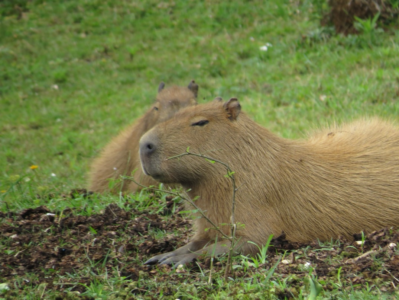

In [ ]:
from PIL import Image
from IPython.display import display

input_img = Image.open("/content/test.jpg")
input_img = v2.Resize(size=300)(input_img)
display(input_img)

Рассмотрим несколько примеров аугментаций картинок. С полным списком можно ознакомиться на сайте [документации torchvision 🛠️[doc]](https://pytorch.org/vision/stable/auto_examples/transforms/plot_transforms_illustrations.html#sphx-glr-auto-examples-transforms-plot-transforms-illustrations-py). Отметим, что более актуальной версией сейчас является `transforms.v2`, которую мы и будем использовать.

#### Random Rotation

Трансформация `transforms.v2.RandomRotation` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.RandomRotation.html) принимает параметр `degrees` — диапазон углов, из которого выбирается случайный угол для поворота изображения.

Создадим переменную `transform`, в которую добавим нашу аугментацию, и применим ее к исходному изображению. Затем запустим следующую ячейку несколько раз подряд

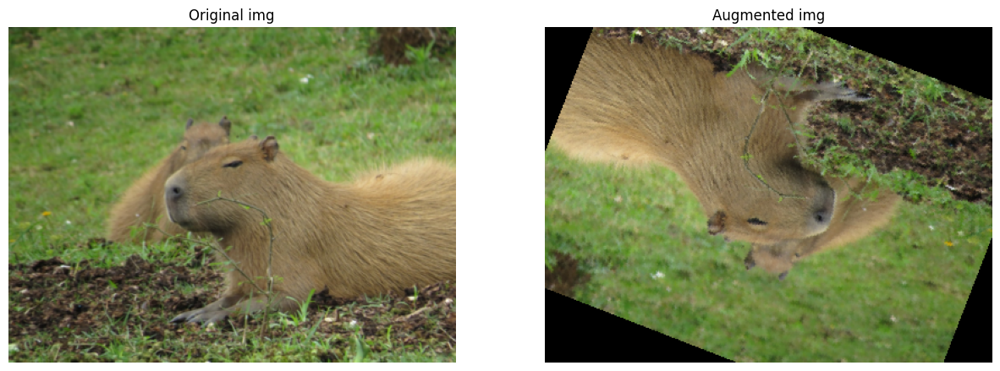

In [ ]:
import matplotlib.pyplot as plt


def plot_augmented_img(transform, input_img):
    fig, ax = plt.subplots(1, 2, figsize=(15, 15))
    augmented_img = transform(input_img)
    ax[0].imshow(input_img)
    ax[0].set_title("Original img")
    ax[0].axis("off")

    ax[1].imshow(augmented_img)
    ax[1].set_title("Augmented img")
    ax[1].axis("off")
    plt.show()


transform = v2.RandomRotation(degrees=(0, 180))

plot_augmented_img(transform, input_img)

#### Gaussian Blur

`transforms.v2.GaussianBlur` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.GaussianBlur.html) размывает изображение с помощью фильтра Гаусса.

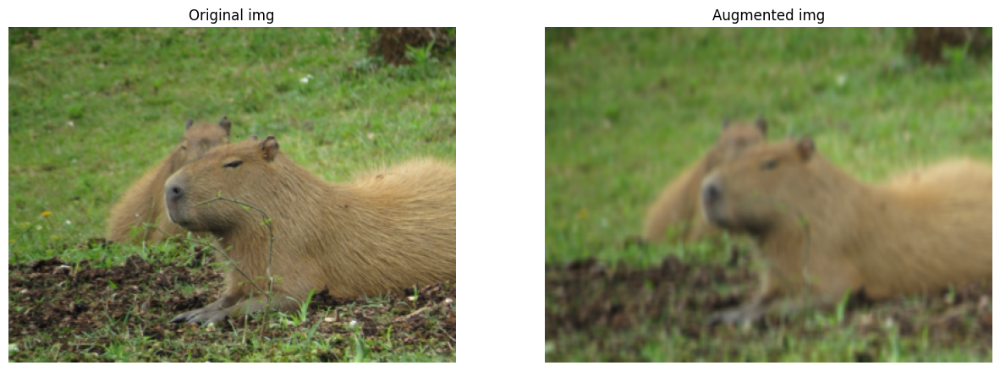

In [ ]:
transform = v2.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))

plot_augmented_img(transform, input_img)

#### Random Erasing

`transforms.v2.RandomErasing` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.RandomErasing.html) стирает на изображении произвольный прямоугольник. Она имеет параметр `p` — вероятность, с которой данная трансформация вообще применится к изображению.

Данная трансформация работает только с `torch.Tensor`, поэтому предварительно нужно применить трансформации `ToImage()`, `ToDtype(torch.float32, scale=True)`, а затем `ToPILImage()`, чтобы воспользоваться нашей функцией для отображения.



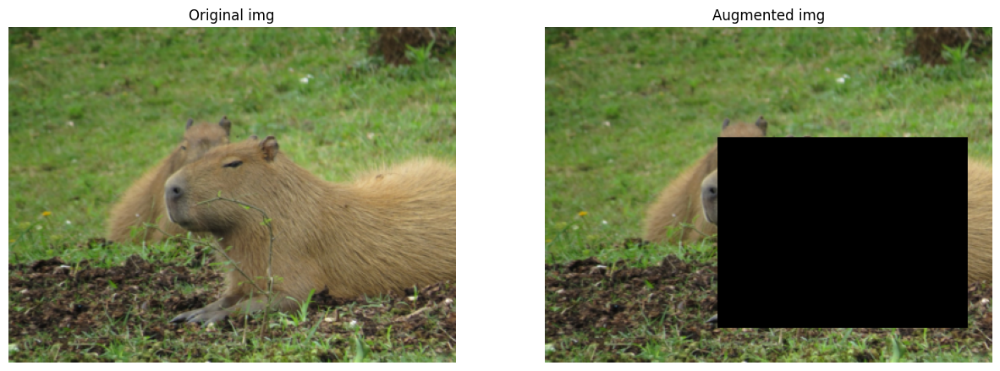

In [ ]:
transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
        v2.RandomErasing(p=1),
        v2.ToPILImage(),
    ]
)

plot_augmented_img(transform, input_img)

Не лишним будет заметить, что некоторые трансформации могут существенно исказить изображение. Например, здесь `RandomErasing` практически полностью стерла основной объект на снимке — капибару. Такая грубая аугментация может только навредить процессу обучения, и на практике нужно быть осторожным.

`RandomErasing` также имеет параметр `scale` — диапазон соотношения стираемой области к входному изображению. Попробуем уменьшить этот диапазон относительно значения по умолчанию, чтобы избежать нежелательного эффекта стирания капибары.

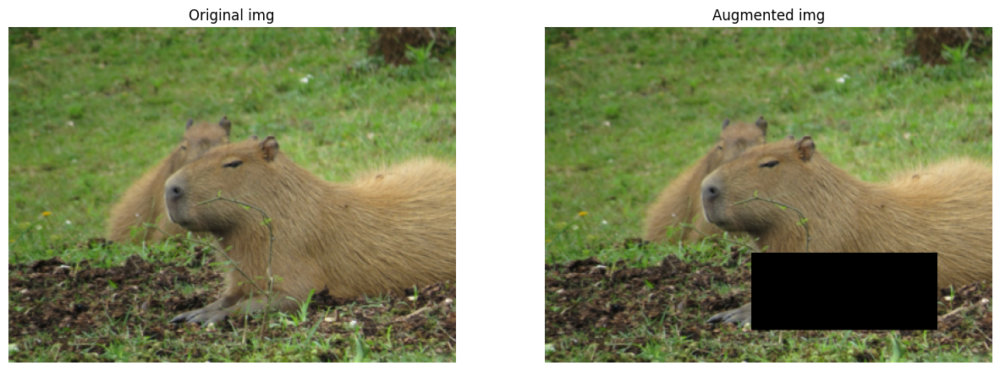

In [ ]:
transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
        v2.RandomErasing(p=1, scale=(0.02, 0.1)),
        v2.ToPILImage(),
    ]
)

plot_augmented_img(transform, input_img)

#### Color Jitter
`transforms.v2.ColorJitter` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.ColorJitter.html) случайным образом меняет яркость, контрастность, насыщенность и оттенок изображения.

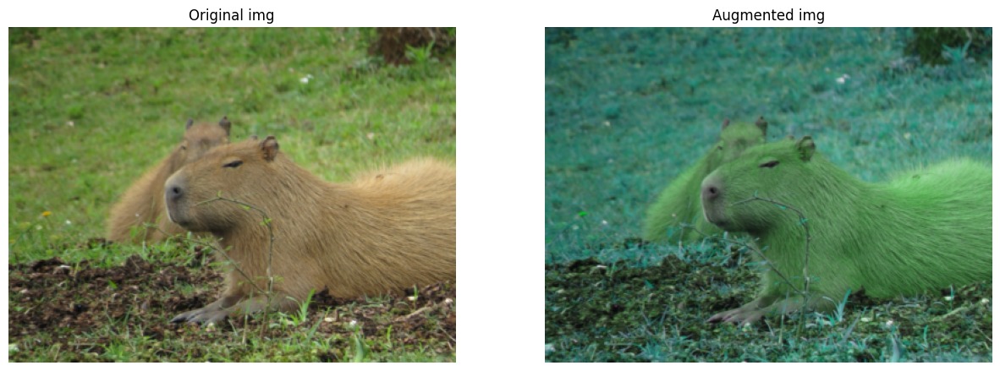

In [ ]:
transform = v2.ColorJitter(brightness=0.5, hue=0.3)

plot_augmented_img(transform, input_img)

#### Совмещаем несколько аугментаций вместе

Для этого будем использовать метод `transforms.v2.Compose` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.Compose.html), с которым мы хорошо знакомы. Нам нужно будет создать `list` со всеми аугментациями, которые будут применены последовательно.

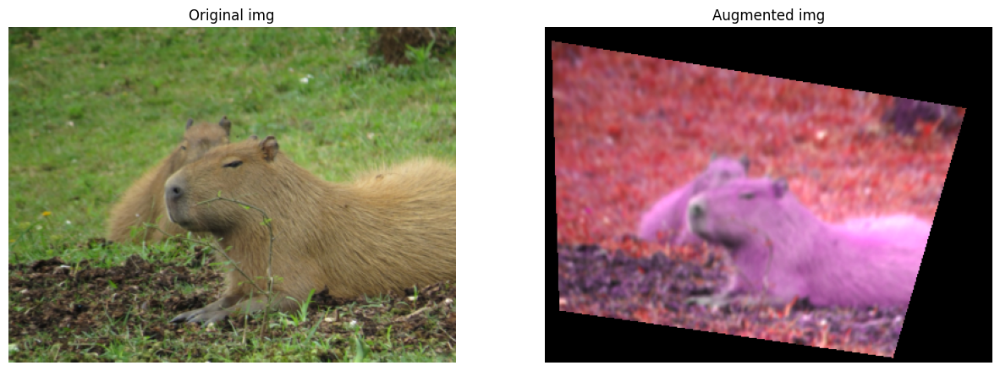

In [ ]:
transform = v2.Compose(
    [
        v2.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        v2.RandomPerspective(distortion_scale=0.5, p=1.0),
        v2.ColorJitter(brightness=0.5, hue=0.3),
    ]
)

plot_augmented_img(transform, input_img)

#### Совмещение нескольких аугментаций случайным образом

Как видно, три аугментации, примененные последовательно, достаточно сильно изменили картинку. Разумнее применять не все сразу. Для этого есть соответствующие классы.

##### <font size="4">Random Apply</font>

Для того, чтобы применять аугментации случайным образом, можно воспользоваться классом `transforms.v2.RandomApply` [🛠️[doc]](https://pytorch.org/vision/stable/generated/torchvision.transforms.v2.RandomApply.html), конструктор которого принимает на вход  список аугментаций и вероятность `p`, с которой каждая аугментация будет применена.

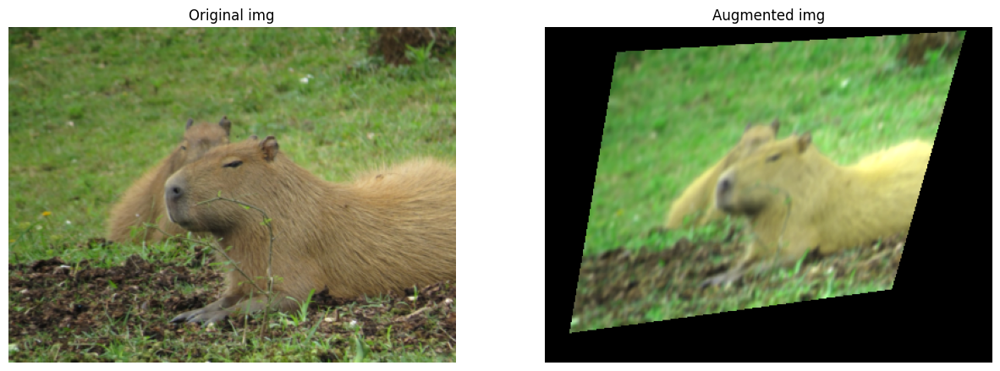

In [ ]:
transform = v2.RandomApply(
    transforms=[
        v2.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        v2.RandomPerspective(distortion_scale=0.5),
        v2.ColorJitter(brightness=0.5, hue=0.3),
    ],
    p=0.9,
)

plot_augmented_img(transform, input_img)

##### <font size="4">Random Choice</font>

В других случаях может быть полезен класс `transforms.v2.RandomChoice` [🛠️[doc]](https://pytorch.org/vision/main/generated/torchvision.transforms.v2.RandomChoice.html), конструктор которого принимает на вход список аугментаций `transforms.v2`, выбирает из него **одну** случайную аугментацию и применяет ее к изображению. Необязательным параметром является список вероятностей `p`, который указывает, с какой вероятностью каждая из аугментаций может быть выбрана из списка (по умолчанию каждая может быть выбрана равновероятно).

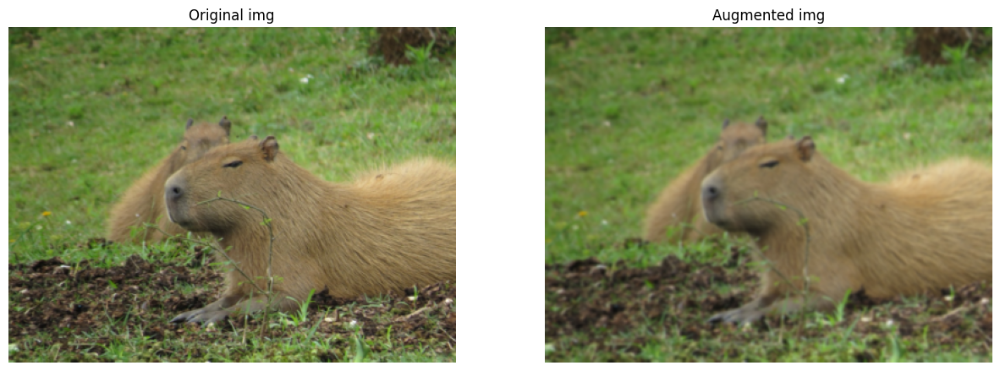

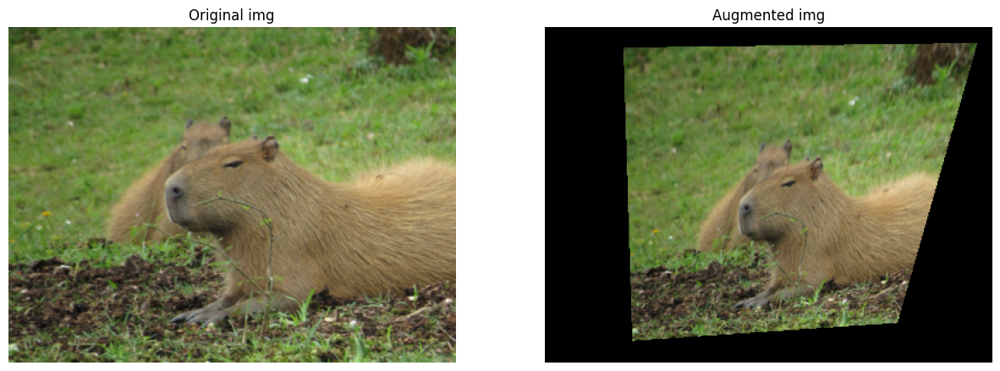

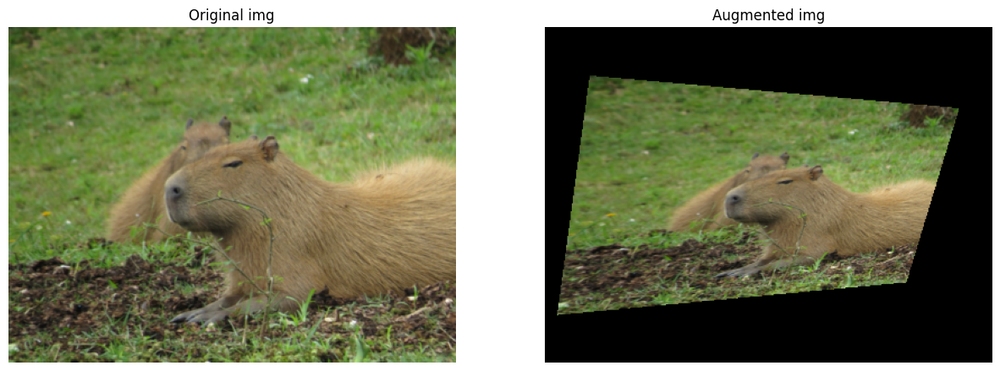

In [ ]:
transform = v2.RandomChoice(
    transforms=[
        v2.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        v2.RandomPerspective(distortion_scale=0.5, p=1.0),
        v2.ColorJitter(brightness=0.5, hue=0.3),
    ],
    p=[0.2, 0.4, 0.6],
)

plot_augmented_img(transform, input_img)
plot_augmented_img(transform, input_img)
plot_augmented_img(transform, input_img)

#### Пример создания собственной аугментации

Иногда может оказаться, что среди широкого спектра реализованных аугментаций нет такой, которую вы хотели бы применить к своим данным. В таком случае ее можно описать в виде класса и использовать наравне с реализованными в библиотеке.

Главное, что необходимо описать при создании класса, — метод `__call__`. Он должен принимать изображение (оно может быть представлено в формате `PIL.Image`, `np.array` или `torch.Tensor`), делать с ним интересующие нас видоизменения и возвращать измененное изображение.

Рассмотрим пример добавления на изображение [шума "соль и перец" 📚[wiki]](https://ru.wikipedia.org/wiki/Salt_and_pepper). Наш метод аугментации будет и принимать на вход, и возвращать `PIL.Image`.



In [ ]:
import numpy as np
from PIL import Image


class SaltAndPepperNoise:
    """
    Add a "salt and pepper" noise to the PIL image
    __call__ method returns PIL Image with noise
    """

    def __init__(self, p=0.01):
        self.p = p  # noise level

    def __call__(self, pil_image):
        np_image = np.array(pil_image)

        # Create random mask for "salt" and "pepper" pixels
        salt_ind = np.random.choice(
            a=[True, False], size=np_image.shape[:2], p=[self.p, 1 - self.p]
        )
        pepper_ind = np.random.choice(
            a=[True, False], size=np_image.shape[:2], p=[self.p, 1 - self.p]
        )

        # Add "salt" and "pepper"
        np_image[salt_ind] = 255
        np_image[pepper_ind] = 0

        return Image.fromarray(np_image)

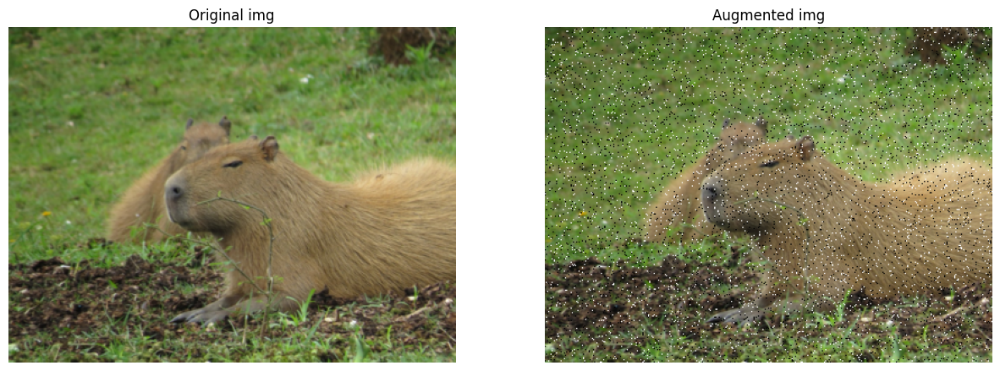

In [ ]:
transform = SaltAndPepperNoise(p=0.03)

plot_augmented_img(transform, input_img)

#### Аугментация внутри `Dataset`

Возьмем папку с картинками.

In [ ]:
# download files
!wget -q "https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/for_transforms.Compose.zip" -O data.zip
!unzip -qn "data.zip"

Напишем класс `AugmentationDataset`:

In [ ]:
import glob
from torch.utils.data import Dataset


class AugmentationDataset(Dataset):
    def __init__(self, root, transforms=None):
        self.img_list = glob.glob(root + "*.jpg")
        self.transforms = transforms

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, i):
        img = Image.open(self.img_list[i])
        if self.transforms is not None:
            img = self.transforms(img)
        return img

Создадим `list` с аугментациями, которые мы хотим применить. Многие аугментации в PyTorch работают с Pillow Image, так что картинки не обязательно преобразовывать в тензоры через `ToDtype(torch.float32, scale=True)`.

In [ ]:
transform = v2.Compose(
    [
        v2.Resize((164, 164)),
        v2.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        v2.RandomPerspective(distortion_scale=0.5),
    ]
)

augmentated_dataset = AugmentationDataset(
    "/content/for_transforms.Compose/", transforms=transform
)

Отобразим аугментированные изображения:

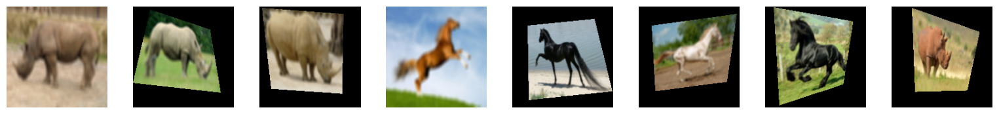

In [ ]:
plt.figure(figsize=(22, 2))
for i, img in enumerate(augmentated_dataset):
    plt.subplot(1, len(augmentated_dataset) + 1, 1 + i)
    plt.axis("off")
    plt.imshow(np.array(img))
plt.show()

#### Аугментация в реальных задачах

Кроме методов, реализованных в PyTorch, существуют и специализированные библиотеки для аугментации изображений, в которых реализованы дополнительные возможности (например, наложение теней, бликов или пятен воды на изображение).

Например:
- [[doc] 🛠️ Albumentations](https://albumentations.ai)
- [[doc] 🛠️ imgaug](https://imgaug.readthedocs.io/en/latest/index.html)
- [[doc] 🛠️ AugLy](https://github.com/facebookresearch/AugLy)

**Важно: при выборе методов аугментации имеет смысл использовать только те, которые будут в реальной жизни.**

Например, нет смысла:
- делать перевод изображения в черно-белое, если предполагается, что весь входящий поток будет цветным,
- отражать человека вверх ногами, если мы не предполагаем его таким распознавать.

# Визуализация


Чтобы лучше понять, как работают сверточные сети, можно визуализировать карты признаков и веса фильтров свёртки.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L06/out/what_hidden_layers.png" width="1000">

## Визуализация весов

Веса фильтров на первом слое легко визуализировать. И результат легко интерпретируется, так как у фильтров такое же количество каналов, как и у цветных изображений ($3$ канала).

Ниже приведен пример того, как это можно сделать для обученной модели AlexNet из зоопарка моделей torchvision.

Чтобы понять, через какие свойства можно получить доступ к весам, выведем структуру модели

In [ ]:
from torchvision import models

alexnet = models.alexnet(weights="AlexNet_Weights.DEFAULT")
print(alexnet)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 180MB/s]


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Видно, что первый слой — это $0$-й элемент контейнера `features`.
Веса слоя хранятся в `weight.data`.

In [ ]:
weight_tensor = alexnet.features[0].weight.data  # extract weights
print("Weights shape", weight_tensor.shape)

Weights shape torch.Size([64, 3, 11, 11])


Чтобы отобразить все веса на одном изображении, воспользуемся вспомогательной функцией `make_grid` [🛠️[doc]](https://pytorch.org/vision/stable/generated/torchvision.utils.make_grid.html#make-grid) из `torchvision.utils` [🛠️[doc]](https://pytorch.org/vision/stable/utils.html).

На вход метод получает `batch` изображений ($B \times C \times H \times W$) в формате `torch.Tensor` и визуализирует их в форме таблице.

In [ ]:
from torchvision import utils

img_grid = utils.make_grid(
    (weight_tensor + 1) / 2, pad_value=1
)  # combine weights from all channel into table, note remapping to (0,1) range
print("Output is CxHxW image", img_grid.shape)

Output is CxHxW image torch.Size([3, 106, 106])


`make_grid` часто используют, чтобы отображать изображения в TensorBoard.

А чтобы отобразить получившуюся таблицу в блокноте средствами matplotlib, нам потребуется поменять порядок хранения данных, поместив каналы на первое место.

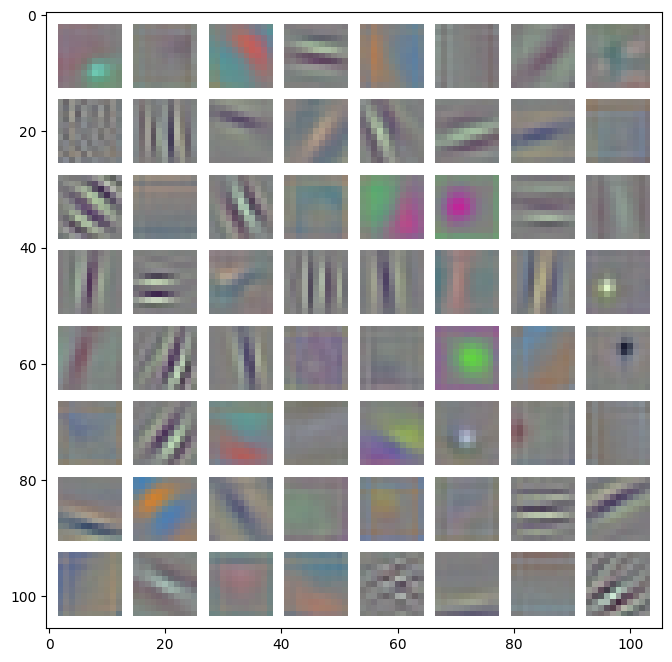

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


plt.rcParams["figure.figsize"] = (8, 8)
plt.imshow(
    np.transpose(img_grid, (1, 2, 0))
)  # change channel order for compability with numpy & matplotlib
plt.show()

Видно, что модель научилась улавливать простые геометрические формы: края под разными углами, точки того или иного цвета. Фильтры AlexNet'а оказались настолько большими, что частично захватили не только простую локальную информацию, но и сложные градиенты или решётки.


### Визуализация фильтров промежуточных слоев

К сожалению, выполнить ту же операцию для фильтров на скрытых слоях едва ли представляется разумным: в отличие от трёхканальных фильтров первого слоя, веса которых легко визуализировать, фильтры поздних слоёв имеют гораздо больше каналов, что затрудняет их визуализацию. Пожалуй, единственным вариантом  является поканальное отображение весов, которое довольно сложно трактовать. Убедимся в этом, на примере ниже.

**Higher Layer: Visualize Filter**

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L06/weight_visualization.png" width="700"></center>

<center><em> We can visualize filters at higher layers, but not that interesting</em></center>

<center><em>Source: <a href="https://cs.stanford.edu/people/karpathy/convnetjs/demo/cifar10.html">ConvNetJS CIFAR-10 example</a></em></center>

Визуализируем веса $2$-го сверточного слоя AlexNet.
Слой доступен через `features[3] `

In [ ]:
weights_of_conv2_layer = alexnet.features[3].weight.data  # extract weights
print(weights_of_conv2_layer.shape)

torch.Size([192, 64, 5, 5])


В нем $192$ фильтра, в каждом $64$ ядра. Поэтому ограничимся первым фильтром и выведем все его ядра.

In [ ]:
first_filter_kernels = weights_of_conv2_layer[0]
print(first_filter_kernels.shape)

torch.Size([64, 5, 5])


Чтобы использовать `image_grid`, входной тензор должен иметь формат $(B \times C \times H \times W)$. Поэтому добавим размерность, соответствующую каналам:

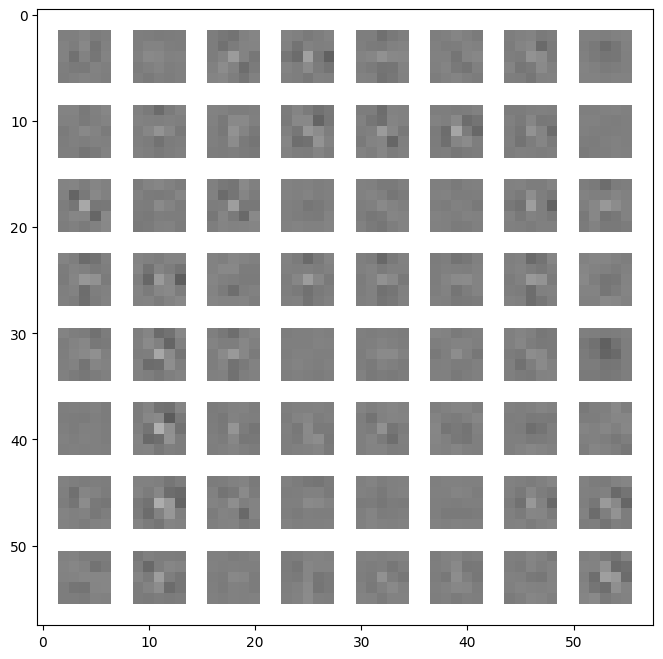

In [ ]:
img_grid = utils.make_grid(
    weights_of_conv2_layer[0].unsqueeze(1), pad_value=1  # add fake channel dim
)

plt.rcParams["figure.figsize"] = (8, 8)
plt.imshow(
    np.transpose((img_grid + 1) / 2, (1, 2, 0))
)  # change channel order for compability with numpy
plt.show()

Интерпретация такой визуализации довольно затруднительна, зато мы разобрались, как получать доступ к весам.

# Другие виды сверток


## 1D

Сигнал, который мы обрабатываем при помощи сверточного слоя, не обязательно должен быть картинкой и не обязательно должен быть двумерным.

В качестве примера такого сигнала может выступать звук:

In [ ]:
import torchaudio

dataset = torchaudio.datasets.YESNO("./", download=True)

100%|██████████| 4.49M/4.49M [00:01<00:00, 2.39MB/s]


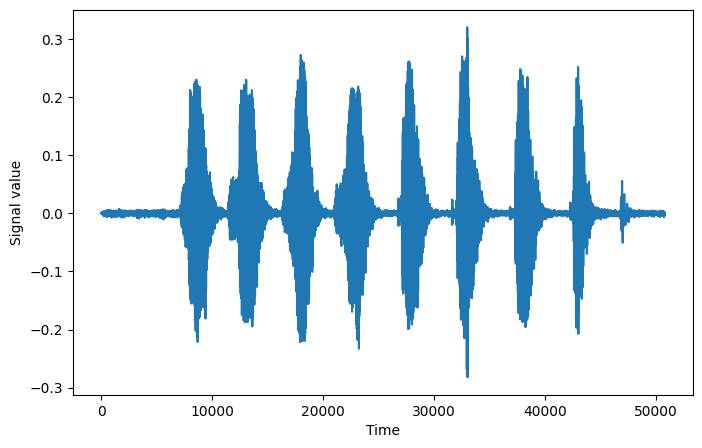

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.xlabel("Time")
plt.ylabel("Signal value")

waveform, sample_rate, label = dataset[0]

plt.plot(waveform.flatten())
plt.show()

В PyTorch одномерная свертка задается аналогично двумерной — `torch.nn.Conv1d` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.Conv1d.html):

```python
torch.nn.Conv1d(in_channels, out_channels, kernel_size, stride=1, padding=0, ...)
```

In [ ]:
from torch import nn

conv = nn.Conv1d(1, 16, 3, stride=2)
output = conv(waveform)
print(output.shape)

torch.Size([16, 25399])


Но такой сигнал чаще преобразуют в спектрограмму, а к ней уже можно применить 2D-свёртку:

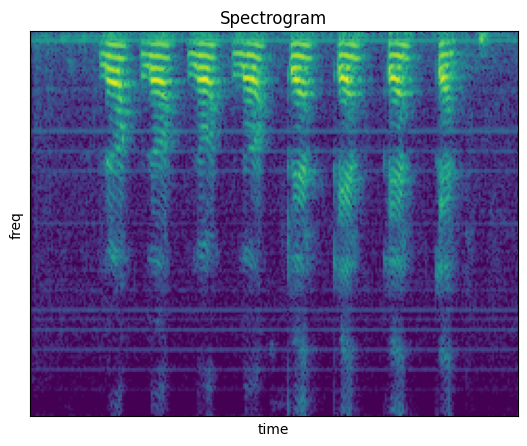

In [ ]:
import librosa
from torchaudio.transforms import Spectrogram


spec_obj = Spectrogram(power=2, center=True, pad_mode="reflect")
spec = spec_obj(waveform[0])

plt.figure(figsize=(7, 5))
plt.imshow(librosa.power_to_db(spec))
plt.title("Spectrogram")
plt.xlabel("time")
plt.ylabel("freq")
plt.xticks([], [])
plt.yticks([], [])
plt.show()

Другим примером могут являться, например, **спектрограммы растворов**.

### Медицинские 3D снимки

Другой популярный тип 3D-данных — это медицинские снимки (KT, МРТ). Для их хранения используются специальные форматы ([NIFTI ✏️[blog]](https://brainder.org/2012/09/23/the-nifti-file-format/), [DICOM 📚[wiki]](https://en.wikipedia.org/wiki/DICOM)).


Для работы с ними существуют специальные библиотеки. Воспользуемся одной из них — библиотекой [NiBabel 🛠️[doc]](https://nipy.org/nibabel/coordinate_systems.html), чтобы преобразовать файл из формата NIFTI в 3D-массив. Для этого скачаем образец МРТ мозга:



In [ ]:
# !wget -q https://nipy.org/nibabel/_downloads/f76cc5a46e5368e2c779868abc49e497/someones_epi.nii.gz
!wget -q https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/someones_epi.nii.gz

И откроем его при помощи NiBabel:

In [ ]:
import nibabel as nib

epi_img = nib.load("someones_epi.nii.gz")
epi_img_data = epi_img.get_fdata()
print(epi_img_data.shape)
print("Max", epi_img_data.max(), "Min", epi_img_data.min())

(53, 61, 33)
Max 103.76662158966064 Min 7.742551803588867


Можно воспринимать этот массив как набор черно-белых изображений.

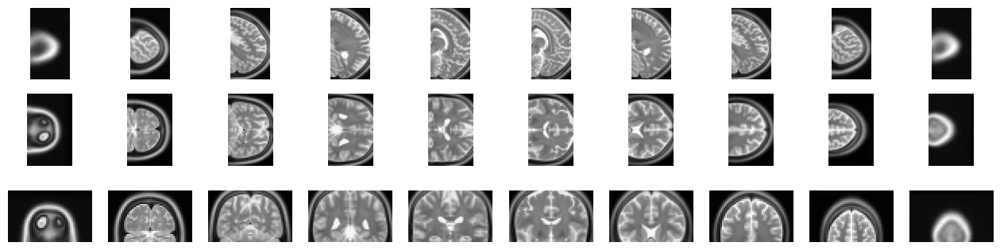

In [ ]:
import numpy as np


def show_slices(ax, data):
    slices = np.linspace(0, len(data) - 1, num=10).astype(int)
    for i, sl in enumerate(slices):
        ax[i].axis("off")
        ax[i].imshow(data[sl], cmap="gray", origin="lower")


fig, axes = plt.subplots(3, 10, figsize=(16, 4))

show_slices(axes[0], epi_img_data)
show_slices(axes[1], np.moveaxis(epi_img_data, 0, 1))
show_slices(axes[2], np.moveaxis(epi_img_data, 0, 2))
plt.show()

Преобразуем массив в `torch.Tensor`. При этом добавим размерность для каналов:

In [ ]:
import torch

brain_mrt = torch.Tensor(epi_img_data)
brain_mrt = brain_mrt.unsqueeze(0)  # add channel dim
print("Add channel dim", brain_mrt.shape)

Add channel dim torch.Size([1, 53, 61, 33])


Теперь можно подать его на вход `Conv3d`:

In [ ]:
from torch import nn

conv3d = nn.Conv3d(
    in_channels=1,
    out_channels=16,
    kernel_size=(3, 3, 3),
    stride=(1, 1, 1),
    padding=(1, 1, 1),
)

out = conv3d(brain_mrt.unsqueeze(0))  # add batch dim and run inference

print("out shape: ", out.shape)

out shape:  torch.Size([1, 16, 53, 61, 33])


# Практические рекомендации

*   Используйте [готовые модели 🛠️[doc]](https://pytorch.org/vision/stable/models.html).
*   Используйте фильтры $3 \times 3 $ — они работают быстрее и эффективнее на практике, используют меньше ресурсов.
*   Чтобы уменьшить пространственные размеры, используйте свертку со `stride = 2`.
*   Чтобы уменьшить количество карт признаков, используйте свертку $1 \times 1$.
*   Сохраняйте логи и следите за ходом обучения при помощи инструментов [TensorBoard 🛠️[doc]](https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html) и [Weights&Biases 🛠️[doc]](https://wandb.ai/site).
*   Отлаживайте код на на части датасета: `debug_train, debug_val, _ = random_split(dataset, [5000, 1000, 54000])`.

<font size=6>Литература</font>

<font size=5>Введение в сверточные нейронные сети:</font>

* [[blog] ✏️ Всё, что вы хотели знать о перцептронах Розенблатта, но боялись спросить](https://habr.com/ru/companies/sberdevices/articles/529932/)
* [[wiki] 📚 Viola–Jones object detection framework](https://en.wikipedia.org/wiki/Viola%E2%80%93Jones_object_detection_framework)

<font size=5>Сверточный слой нейросети:</font>

* [[blog] ✏️ Какого цвета Марс?](https://habr.com/ru/articles/160621/s)

<font size=5>Применение свёрточных слоёв:</font>

* [[doc] 🛠️ LeNet PyTorch documentation](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html)

<font size=5>Другие виды сверток:</font>

* [[blog] ✏️ Convolution vs. Cross-Correlation](https://glassboxmedicine.com/2019/07/26/convolution-vs-cross-correlation/)
* [[blog] ✏️ 2D Convolution as a Matrix-Matrix Multiplication](https://www.baeldung.com/cs/convolution-matrix-multiplication)
* [[blog] ✏️ Forward and Backward Convolution Passes as Matrix Multiplication](https://danieltakeshi.github.io/2019/03/09/conv-matmul/)
* [[blog] ✏️ The NIFTI file format](https://brainder.org/2012/09/23/the-nifti-file-format/)
* [[doc] 🛠️ NiBabel](https://nipy.org/nibabel/coordinate_systems.html)
* [[doc] 🛠️ PyTorch Geometric](https://pytorch-geometric.readthedocs.io/en/latest/)
* [[wiki] 📚 Adjacency matrix](https://en.wikipedia.org/wiki/Adjacency_matrix)
* [[doc] 🛠️ Drawing — basic functionality for visualizing graphs](https://networkx.org/documentation/networkx-1.10/reference/drawing.html)
* [[arxiv] 🎓 Semi-Supervised Classification with Graph Convolutional Networks](https://arxiv.org/abs/1609.02907).
* [[doc] 🛠️ GNN Cheatsheet](https://pytorch-geometric.readthedocs.io/en/latest/notes/cheatsheet.html)

<font size=5>Визуализация:</font>

* [[arxiv] 🎓 Understanding Neural Networks Through Deep Visualization](https://arxiv.org/abs/1506.06579)
* [[demo] 🎮 Exploring Neural Networks with Activation Atlases](https://distill.pub/2019/activation-atlas/)
* [[blog] ✏️ Feature Visualization](https://distill.pub/2017/feature-visualization/)

<font size=5>Lightning:</font>

* [[git] 🐾 Lightning](https://github.com/Lightning-AI/lightning)
* [[doc] 🛠️ TensorBoard](https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html)
* [[doc] 🛠️ Weights&Biases](https://wandb.ai/site)

<font size=5>Дополнительно:</font>

* [[blog] ✏️ Свёртка в Deep Learning простыми словами](https://www.reg.ru/blog/svyortka-v-deep-learning-prostymi-slovami)
* [[arxiv] 🎓 A guide to convolution arithmetic for deep
learning](https://arxiv.org/pdf/1603.07285v1.pdf)
* [[video] 📺 But what is a convolution?](https://www.youtube.com/watch?v=KuXjwB4LzSA)
* [[video] 📺 Fundamental Algorithm of Convolution in Neural Networks](https://www.youtube.com/watch?v=eMXuk97NeSI&list=PLZDCDMGmelH-pHt-Ij0nImVrOmj8DYKbB)